In [1]:
%load_ext autoreload
%autoreload 2


# YOLOv7 blog post

Shortly after its publication, YOLOv7 is the fastest and most accurate real-time object detection model for computer vision tasks. The [official paper](https://arxiv.org/abs/2207.02696) demonstrates how this improved architecture surpasses all previous YOLO versions - as well as all other object detection models - in terms of both speed and accuracy on the MS COCO dataset; achieving this performance without utilizing any pretrained weights. Additionally, following all of the [controversy around the naming conventions of previous Yolo models](https://blog.roboflow.com/yolov4-versus-yolov5/), as Yolov7 was released by the same authors that developed [Scaled-Yolov4](https://arxiv.org/abs/2207.02696), the machine learning community seems happy to accept this as the next iteration of the 'official' Yolo family!

At the point that Yolov7 was released, we - as part of Microsoft's Data & AI Service Line - were partway through a challenging object-detection based customer project, in a domain drastically different to COCO. Needless to say, both ourselves and the customer were very excited at the prospect of applying Yolov7 to our problem. Unfortunately, the results were ... let's just say, not great.

After reading the official paper, we found that, whilst it presents a comprehensive overview on the architectural changes, it omits many details around how the model was trained; for example, which data augmentation techniques were applied, and how the loss function measures that the model is doing a good job! To understand these technicalities, we decided to debug the code directly. However, as the Yolov7 repository is a modified fork of the [YOLOR codebase](https://github.com/WongKinYiu/yolor) - which itself is a fork of [Yolov5](https://github.com/ultralytics/yolov5) - we found that it includes a lot of complex functionality, much of which is not needed when just training a model; for example, being able to specify custom architectures in Yaml format and have these translated into PyTorch models. Additionally, the codebase contains many custom components which have been implemented from scratch - such as a Multi-GPU training loop, several data augmentations, samplers to preserve dataloader workers, and multiple learning rate schedulers - many of which are now available in PyTorch, or other libraries. As a result, there was a lot of code to dissect; it took us a long time to understand how everything worked, as well as the intracies of the training loop which contribute to the model's excellent performance! 

In this article, we intend to take a practical approach in demonstrating how to train Yolov7 models in custom training scripts, as well as exploring areas such as data augmentation techniques, how to select and modify anchor boxes, and demystifying how the loss function works; (hopefully!) enabling you to build up an intiuition to what is likely to work well for your own problems. As the Yolov7 architecture is well described in detail in the official paper, as well as in many other sources, we are not going to cover this here. Instead, we intend to focus on all of the other details which, whilst contibute to Yolov7's performance, are **not** covered in the paper. This tends to be knowledge which has been accumulated over multiple versions of Yolo models, but can be incredibly difficult to track down for someone just entering the field.  

To illustrate these concepts, we shall be using our own implementation of Yolov7, which utilises the official pretrained weights, but has been written with modularity and readability in mind. This project initially started as an exercise for us to improve our understanding of how Yolov7 works under the hood - in order to better understand how to apply it - but after successfully using it on a few different tasks, we have decided to make it publicly available. Whilst we would recommend using the [official implementation](https://github.com/WongKinYiu/yolov7) if you wish to exactly reproduce the published results on COCO, we find that this implementation is more flexible to apply, and extend, to custom domains. Hopefully, this implementation will provide a clean and clear starting point for anyone wishing to experiment with Yolov7 in their own custom training scripts, as well as providing more transparency around the techniques that were used during training in the original implementation.


Contents ideas:
- using a pretrained model
- finetuning on a new dataset
- training from scratch

## Selecting a dataset

Throughout this article, we shall use the [Kaggle cars object detection dataset](https://www.kaggle.com/datasets/sshikamaru/car-object-detection); however, as our aim is to demonstrate how Yolov7 can be applied to any problem, this is really the least important part of this work.

Here, we shall use the Kaggle cars object detection dataset; however, as our aim is to demonstrate how Yolov7 can be applied to any problem, this is really the least important part of this work. As this dataset is quite small, it will enable us to train quickly and get fast feedback. Additionally, as the images are quite similar to COCO, it will enable us to experiment with a pretrained model before we do any training.


In [4]:
from pathlib import Path

import pandas as pd

In [5]:
data_path = "data/cars"
data_path = Path(data_path)
images_path = data_path / "training_images"
annotations_file_path = data_path / "annotations.csv"

In [8]:
from example.train_cars import load_cars_df

The annotations for this dataset are in the form of a .csv file, which associates the image name with the corresponding annotations; where each row represents one bounding box. Whilst there are around 1000 images in the training set, only those with annotations are included in this file. 

We can view the format of this by loading it into a pandas DataFrame. 

In [7]:
pd.read_csv(annotations_file_path)

,image,xmin,ymin,xmax,ymax
0,vid_4_1000.jpg,281.259045,187.035071,327.727931,223.225547
1,vid_4_10000.jpg,15.163531,187.035071,120.329957,236.430180
2,vid_4_10040.jpg,239.192475,176.764801,361.968162,236.430180
3,vid_4_10020.jpg,496.483358,172.363256,630.020260,231.539575
4,vid_4_10060.jpg,16.630970,186.546010,132.558611,238.386422
...,...,...,...,...,...
554,vid_4_9860.jpg,0.000000,198.321729,49.235251,236.223284
555,vid_4_9880.jpg,329.876184,156.482351,536.664239,250.497895
556,vid_4_9900.jpg,0.000000,168.295823,141.797524,239.176652
557,vid_4_9960.jpg,487.428988,172.233646,616.917699,228.839864


As it is not usually the case that all images in our dataset contain instances of the objects that we are trying to detect, we would also like to include some images that do not contain cars. To do this, we can define a function to load the annotations which also includes 100 'negative' images. Additionally, as the designated test set is unlabelled, let's randomly take 20% of these images to use as our validation set. 

In [9]:
??load_cars_df

Signature: load_cars_df(annotations_file_path, images_path)
Docstring: <no docstring>
Source:   
def load_cars_df(annotations_file_path, images_path):
    all_images = sorted(set([p.parts[-1] for p in images_path.iterdir()]))
    image_id_to_image = {i: im for i, im in enumerate(all_images)}
    image_to_image_id = {v: k for k, v, in image_id_to_image.items()}

    annotations_df = pd.read_csv(annotations_file_path)
    annotations_df.loc[:, "class_name"] = "car"
    annotations_df.loc[:, "has_annotation"] = True

    # add 100 empty images to the dataset
    empty_images = sorted(set(all_images) - set(annotations_df.image.unique()))
    non_annotated_df = pd.DataFrame(list(empty_images)[:100], columns=["image"])
    non_annotated_df.loc[:, "has_annotation"] = False
    non_annotated_df.loc[:, "class_name"] = "background"

    df = pd.concat((annotations_df, non_annotated_df))

    class_id_to_label = dict(
        enumerate(df.query("has_annotation == True").class_name.unique())
    )

We can now use this function to load our data:

In [10]:
train_df, valid_df, lookups = load_cars_df(annotations_file_path, images_path)

In [11]:
train_df

,image,xmin,ymin,xmax,ymax,class_name,has_annotation,image_id,class_id
0,vid_4_1000.jpg,281.259045,187.035071,327.727931,223.225547,car,True,0,0.0
1,vid_4_10000.jpg,15.163531,187.035071,120.329957,236.430180,car,True,1,0.0
2,vid_4_10040.jpg,239.192475,176.764801,361.968162,236.430180,car,True,3,0.0
4,vid_4_10060.jpg,16.630970,186.546010,132.558611,238.386422,car,True,4,0.0
5,vid_4_10100.jpg,447.568741,160.625804,582.083936,232.517696,car,True,6,0.0
...,...,...,...,...,...,...,...,...,...
91,vid_4_13060.jpg,NaN,NaN,NaN,NaN,background,False,142,NaN
93,vid_4_13100.jpg,NaN,NaN,NaN,NaN,background,False,144,NaN
95,vid_4_13240.jpg,NaN,NaN,NaN,NaN,background,False,146,NaN
97,vid_4_13280.jpg,NaN,NaN,NaN,NaN,background,False,148,NaN


To make it easier to associate predictions with an image, we have assigned each image a unique id; in this case it is just an incrementing integer count. Additionally, we have added an integer value to represent the classes that we want to detect, which is a single class - 'car' - in this case.

Generally, object detection models reserve `0` as the background class, so class labels should start from `1`. This is **not** the case for Yolov7, so we start our class encoding from `0`. For images that do not contain a car, we do not require a class id. We can confirm that this is the case by inspecting the lookups returned by our function.

In [33]:
lookups.keys()

dict_keys(['image_id_to_image', 'image_to_image_id', 'class_id_to_label', 'class_label_to_id'])

In [34]:
lookups['class_label_to_id'], lookups['class_label_to_id']

({'car': 0}, {'car': 0})

Finally, let's use our dataset to see the number of images in each class for our training and validation sets. As an image can have multiple annotations, we need to make sure that we account for this when calculating our counts:

In [35]:
print(f"Num. annotated images in training set: {len(train_df.query('has_annotation == True').image.unique())}")
print(f"Num. Background images in training set: {len(train_df.query('has_annotation == False').image.unique())}")
print(f"Total Num. images in training set: {len(train_df.image.unique())}")
print('------------')

print(f"Num. annotated images in validation set: {len(valid_df.query('has_annotation == True').image.unique())}")
print(f"Num. Background images in validation set: {len(valid_df.query('has_annotation == False').image.unique())}")
print(f"Total Num. images in validation set: {len(valid_df.image.unique())}")

Num. annotated images in training set: 256
Num. Background images in training set: 68
Total Num. images in training set: 324
------------
Num. annotated images in validation set: 99
Num. Background images in validation set: 32
Total Num. images in validation set: 131


## Create a Dataset Adaptor

Usually, at this point, we would create a PyTorch dataset specific to the model that we shall be training. 

However, we often use the pattern of first creating a dataset 'adaptor' class, with the sole responsibility of wrapping the underlying data sources and loading this approriately. This way, we can easily switch out adaptors when using different datasets, without changing any preprocessing logic which is specific to the model that we are training.

Therefore, let’s focus for now on creating a `CarsDatasetAdaptor` class, which converts the specific raw dataset format into an image and corresponding annotations. Additionally, let's load the image id that we assigned, as well as the height and width of our image, as they may be useful to us later on.

An implementation of this is presented below:

In [27]:
from example.train_cars import CarsDatasetAdaptor

In [28]:
??CarsDatasetAdaptor

Init signature: CarsDatasetAdaptor(*args, **kwds)
Docstring:     
An abstract class representing a :class:`Dataset`.

All datasets that represent a map from keys to data samples should subclass
it. All subclasses should overwrite :meth:`__getitem__`, supporting fetching a
data sample for a given key. Subclasses could also optionally overwrite
:meth:`__len__`, which is expected to return the size of the dataset by many
:class:`~torch.utils.data.Sampler` implementations and the default options
of :class:`~torch.utils.data.DataLoader`.

.. note::
  :class:`~torch.utils.data.DataLoader` by default constructs a index
  sampler that yields integral indices.  To make it work with a map-style
  dataset with non-integral indices/keys, a custom sampler must be provided.
Source:        
class CarsDatasetAdaptor(Dataset):
    def __init__(
        self,
        images_dir_path,
        annotations_dataframe,
        transforms=None,
    ):
        self.images_dir_path = Path(images_dir_path)
     

Notice that, for our background images, we are just returning an empty array for our bounding boxes and class ids.

Using this, we can confirm that the length of our dataset is the same as the total number of training images that we calculated earlier.

In [29]:
ds = CarsDatasetAdaptor(images_path, train_df)

In [30]:
len(ds)

324

Now, we can use this to visualise some of our images, as demonstrated below.

In [41]:
from yolov7.plotting import show_image

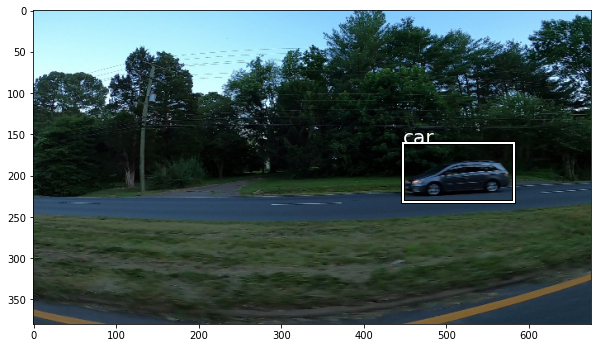

Image id: 6
Image size: (380, 676)


In [42]:
idx = 4
image, xyxy_bboxes, class_ids, image_idx, image_size = ds[idx]
show_image(image, xyxy_bboxes.tolist(), [lookups['class_id_to_label'][int(c)] for c in class_ids])
print(f'Image id: {image_idx}')
print(f'Image size: {image_size}')

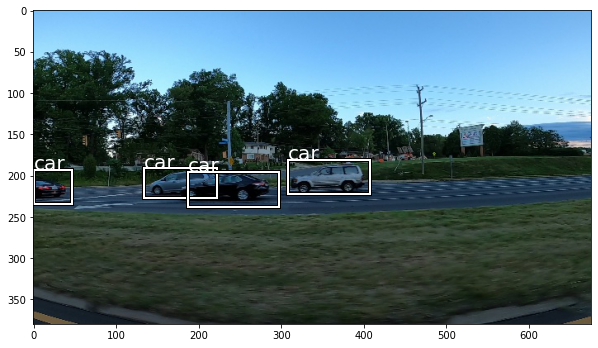

Image id: 848
Image size: (380, 676)


In [43]:
idx = 204
image, xyxy_bboxes, class_ids, image_idx, image_size = ds[idx]
show_image(image, xyxy_bboxes.tolist(), [lookups['class_id_to_label'][int(c)] for c in class_ids])
print(f'Image id: {image_idx}')
print(f'Image size: {image_size}')

## Create Yolov7 dataset

Yolo7 expects labels in cxcywh format

In [20]:
from yolov7.dataset import Yolov7Dataset

In [21]:
??Yolov7Dataset

Init signature: Yolov7Dataset(*args, **kwds)
Docstring:     
An abstract class representing a :class:`Dataset`.

All datasets that represent a map from keys to data samples should subclass
it. All subclasses should overwrite :meth:`__getitem__`, supporting fetching a
data sample for a given key. Subclasses could also optionally overwrite
:meth:`__len__`, which is expected to return the size of the dataset by many
:class:`~torch.utils.data.Sampler` implementations and the default options
of :class:`~torch.utils.data.DataLoader`.

.. note::
  :class:`~torch.utils.data.DataLoader` by default constructs a index
  sampler that yields integral indices.  To make it work with a map-style
  dataset with non-integral indices/keys, a custom sampler must be provided.
Source:        
class Yolov7Dataset(Dataset):
    def __init__(self, dataset, transforms=None):
        self.ds = dataset
        self.transforms = transforms

    def __len__(self):
        return len(self.ds)

    def load_from_data

In [22]:
yolo_ds = Yolov7Dataset(ds)

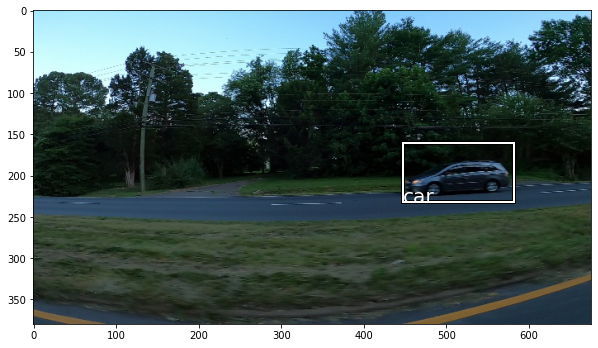

Image id: 6
Image size: tensor([380, 676])


In [23]:
idx = 4
image_tensor, labels, image_id, image_size = yolo_ds[idx]

boxes = labels[:, 2:]
boxes[:, [0, 2]] *= image_size[1]
boxes[:, [1, 3]] *= image_size[0]

show_image(image_tensor.permute( 1, 2, 0), boxes.tolist(), [lookups['class_id_to_label'][int(c)] for c in labels[:, 1]], 'cxcywh')
print(f'Image id: {image_id}')
print(f'Image size: {image_size}')

As we haven't defined any transforms, the output is largely the same, with the main exception being that the boxes are now in normalized cxcywh format and everything has been converted to a tensor.

### Transforms

Now, let's define some transforms! For this, we shall use the excellent Albumentations library, which provides many options for transforming both images and bounding boxes.

Whilst we are largely free to define whichever transforms we like, dependent on the domain, for simplicity let's define similary transforms to those used in the original implementation.

These are:
- resize the image to the given input (multiple of 640) whilst maintaining the aspect ratio
- If the image is not square, apply padding. For this, we shall follow the paper in using a grey padding, this is an arbitary choice.

During training:
- horizontal flip.


In [24]:
from yolov7.dataset import create_yolov7_transforms

Potential todo, add param to add extra transforms

In [25]:
??create_yolov7_transforms

Signature:
create_yolov7_transforms(
    image_size=(1280, 1280),
    flip_prob=0.5,
    training=False,
)
Docstring: <no docstring>
Source:   
def create_yolov7_transforms(image_size=(1280, 1280), flip_prob=0.5, training=False):
    transforms = [
        A.LongestMaxSize(max(image_size)),
        A.PadIfNeeded(
            image_size[0],
            image_size[1],
            border_mode=0,
            value=(114, 114, 114),
        ),
    ]

    if training:
        transforms.extend(
            [
                A.HorizontalFlip(p=flip_prob),
            ]
        )

    return A.Compose(
        transforms,
        bbox_params=A.BboxParams(format="pascal_voc", label_fields=["labels"]),
    )
File:      /mnt/yolov7/dataset.py
Type:      function


In [26]:
target_image_size = 640

In [27]:
yolo_ds = Yolov7Dataset(ds, transforms=create_yolov7_transforms(image_size=(target_image_size, target_image_size)))

In [28]:
image_tensor.shape

torch.Size([3, 380, 676])

In [29]:
image_tensor.shape

torch.Size([3, 380, 676])

In [30]:
image_size

tensor([380, 676])

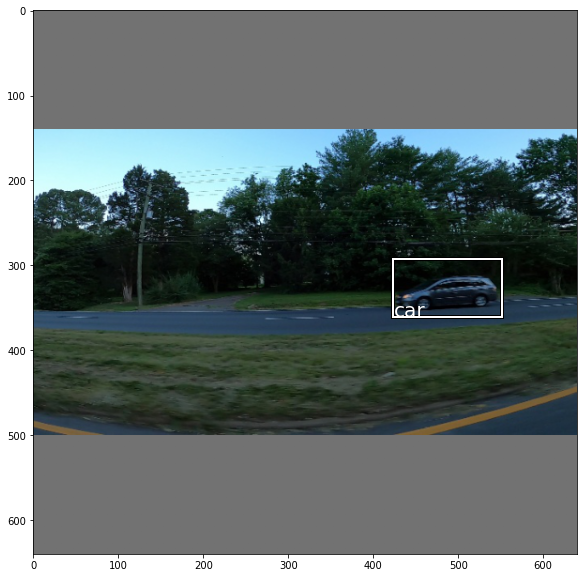

Image id: 6
Original Image size: tensor([380, 676])
Resized Image size: torch.Size([640, 640])


In [31]:
idx = 4
image_tensor, labels, image_id, image_size = yolo_ds[idx]

boxes = labels[:, 2:]
boxes[:, [0, 2]] *= target_image_size
boxes[:, [1, 3]] *= target_image_size

show_image(image_tensor.permute( 1, 2, 0), boxes.tolist(), [lookups['class_id_to_label'][int(c)] for c in labels[:, 1]], 'cxcywh')
print(f'Image id: {image_id}')
print(f'Original Image size: {image_size}')
print(f'Resized Image size: {image_tensor.shape[1:]}')

## Loading the model

So that we can understand how to interface with the model, let's load a pretrained checkpoint and use this for inference on some images in our dataset. As this checkpoint was trained on coco, which contains images of cars, we can assume that the model should perform moderately well on this task out of the box.

In [32]:
from yolov7.models.model_factory import create_yolov7_model

In [46]:
model = create_yolov7_model('yolov7')

Transferred 564/566 items from https://github.com/Chris-hughes10/Yolov7-training/releases/download/alpha/yolov7_training_state_dict.pt


In [47]:
model.eval()

Yolov7Model(
  (model): Sequential(
    (0): Conv(
      (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
      (act): SiLU(inplace=True)
    )
    (1): Conv(
      (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
      (act): SiLU(inplace=True)
    )
    (2): Conv(
      (conv): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
      (act): SiLU(inplace=True)
    )
    (3): Conv(
      (conv): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(128, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
      (act): SiLU(inplace=True)
    )
    (4): Co

let's take a look at the model's predictions

In [67]:
import torch

with torch.no_grad():
    model_outputs = model(image_tensor[None])
    # preds = model._derive_preds(model_outputs)
    preds = model.postprocess(model_outputs, conf_thres=0.1)

In [60]:
preds.shape

AttributeError: 'list' object has no attribute 'shape'

In [43]:
model_outputs[0].shape

torch.Size([1, 3, 80, 80, 7])

In [39]:
preds[0].shape

torch.Size([991, 6])

Inspecting the shape, we can see that the model has made 25200 predictions! Each prediction has an associated tensor of length 85 - the first 4 entries correspond to the bounding box coordinates in cxcywh format, an object confidence socre, with the remaining entries representing a confidence score for each class that the model has been trained on. Here, to make the number of predictions more manageable, I shall filter any predictions with a confidence below a predefined theshold. To understand how the model is performing, I have set this quite low by default. 

To make it easier to interpret the model outputs, let's define a post processing function to unpack these predictions. 

Finally, let's convert our prediction format to xxyx, as I personally find this the most intiuitive.

In [58]:
from yolov7.models.yolo import process_yolov7_outputs

ImportError: cannot import name 'process_yolov7_outputs' from 'yolov7.models.yolo' (/mnt/yolov7/models/yolo.py)

In [39]:
??process_yolov7_outputs

Signature:
process_yolov7_outputs(
    model_outputs,
    conf_thres=0.001,
    max_detections=30000,
    multiple_labels_per_box=True,
)
Docstring: <no docstring>
Source:   
def process_yolov7_outputs(
        model_outputs, conf_thres=0.001, max_detections=30000, multiple_labels_per_box=True
):
    # TODO move this function inside the model
    model_outputs = model_outputs[0]
    num_classes = model_outputs.shape[2] - 5

    outputs = [torch.zeros((0, 6), device=model_outputs.device)] * model_outputs.shape[
        0
    ]

    for image_idx, detections_for_image in enumerate(
            model_outputs
    ):  # image index, image inference

        # filter by confidence
        detections_for_image = detections_for_image[
            detections_for_image[:, 4] >= conf_thres
            ]

        # If none remain process next image
        if not detections_for_image.shape[0]:
            continue

        if num_classes == 1:
            detections_for_image[:, 5:] = detections_f

In [40]:
processed_predictions = process_yolov7_outputs(model_outputs, conf_thres=0.1)

In [41]:
processed_predictions

[tensor([[4.2501e+02, 3.1203e+02, 5.4695e+02, 3.5355e+02, 1.3396e-01, 2.0000e+00],
         [4.2561e+02, 3.1228e+02, 5.4716e+02, 3.5305e+02, 9.1770e-01, 2.0000e+00],
         [4.2542e+02, 3.1231e+02, 5.4670e+02, 3.5306e+02, 9.4651e-01, 2.0000e+00],
         [4.2528e+02, 3.1211e+02, 5.4667e+02, 3.5300e+02, 9.4794e-01, 2.0000e+00],
         [4.2574e+02, 3.1224e+02, 5.4716e+02, 3.5308e+02, 9.3330e-01, 2.0000e+00],
         [4.2544e+02, 3.1227e+02, 5.4663e+02, 3.5309e+02, 9.4304e-01, 2.0000e+00],
         [4.2531e+02, 3.1213e+02, 5.4662e+02, 3.5300e+02, 9.5174e-01, 2.0000e+00],
         [4.2559e+02, 3.1202e+02, 5.4721e+02, 3.5306e+02, 2.1777e-01, 2.0000e+00],
         [4.2541e+02, 3.1222e+02, 5.4666e+02, 3.5316e+02, 9.3995e-01, 2.0000e+00],
         [4.2535e+02, 3.1199e+02, 5.4661e+02, 3.5314e+02, 9.4261e-01, 2.0000e+00],
         [4.2548e+02, 3.1209e+02, 5.4653e+02, 3.5326e+02, 3.8395e-01, 2.0000e+00]])]

In [61]:
preds

[tensor([[425.61481, 312.27795, 547.15778, 353.05334,  15.35738,   2.00000],
         [425.41962, 312.30847, 546.69543, 353.06006,  25.41244,   2.00000],
         [425.27991, 312.11353, 546.67340, 353.00177,  25.33647,   2.00000],
         [425.74130, 312.24371, 547.15808, 353.08252,  20.08647,   2.00000],
         [425.44019, 312.26663, 546.63129, 353.08798,  26.09521,   2.00000],
         [425.31299, 312.13025, 546.62262, 352.99756,  27.75024,   2.00000],
         [425.40515, 312.22342, 546.65619, 353.16306,  21.07888,   2.00000],
         [425.34641, 311.98761, 546.60956, 353.14362,  20.76207,   2.00000]])]

After applying our processing, we can see that the number of predictions has been reduced significantly! However, inspecting the boxes by eye we can see that they all look very similar, with lots of overlap! To remove overlapping predictions, let's apply NMS to this output. We can define a function to do this as demonstrated below:

In [62]:
from typing import List

import torchvision
from torch import Tensor

def filter_eval_predictions(predictions: Tensor,
                            confidence_threshold: float = 0,
                            nms_threshold: float = 0.1) -> List[Tensor]:
    nms_preds = []
    for pred in predictions:
        pred = pred[pred[:, 4] > confidence_threshold]

        nms_idx = torchvision.ops.batched_nms(
            boxes=pred[:, :4],
            scores=pred[:, 4],
            idxs=pred[:, 5],
            iou_threshold=nms_threshold,
        )
        nms_preds.append(pred[nms_idx])

    return nms_preds

In [63]:
nms_predictions = filter_eval_predictions(preds)

In [64]:
nms_predictions

[tensor([[425.31299, 312.13025, 546.62262, 352.99756,  27.75024,   2.00000]])]

After applying NMS, we can see that now we only have a single prediction for this image. Let's visualise how this looks:

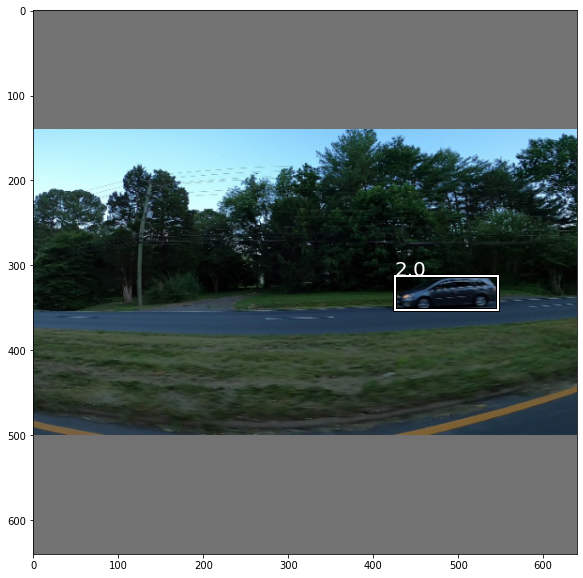

Image id: 6
Original Image size: tensor([380, 676])
Resized Image size: torch.Size([640, 640])


In [65]:

boxes = nms_predictions[0][:, :4]
class_ids = nms_predictions[0][:, -1]

show_image(image_tensor.permute( 1, 2, 0), boxes.tolist(), class_ids.tolist())
print(f'Image id: {image_id}')
print(f'Original Image size: {image_size}')
print(f'Resized Image size: {image_tensor.shape[1:]}')

We can see that this looks pretty good! The prediction from the model is actually tighter around the car than the ground truth!

## Training the model

To obtain the level of performance reported in the paper, Yolov7 was trained using a variety of techniques. However, for our purposes, lets start with the minimal possible training loop required, before gradually introducing different techniques. 

To handle the boilerplate aspects of the training loop, let's use PyTorch-accelerated. This will enable us to define only the the parts of the training loop which are relevant to our use case, without having to manage all of the boilerplate.

Let's override the default `Trainer` and create a trainer specific to our YoloX model. Our training step is quite straightforward, with the only modification being that we need to extract the total loss from the dictionary that is returned. For the evaluation step, we first calculate the losses, and then retrieve the detections.

Additionally, let's define a method to transform our targets into a similar format to our predictions, this will make our evaluation easier.

In [197]:
from yolov7.trainer import Yolov7Trainer

In [198]:
??Yolov7Trainer

Init signature:
Yolov7Trainer(
    model,
    loss_func,
    eval_loss_func,
    optimizer,
    callbacks,
    filter_eval_predictions=None,
)
Docstring:     
The Trainer is designed to encapsulate an entire training loop for a specific task, bringing together the model,
loss function and optimizer, and providing a specification of the behaviour to execute for each step of the training
process.

The trainer has been implemented such that it provides (overridable) implementations of the parts of training
that rarely change after they have been defined – such as creating a data loader, or how a batch of data is fed to
the model – whilst remaining decoupled from components that are likely to change, such as the model, dataset,
loss function and optimizer.
Source:        
class Yolov7Trainer(Trainer):
    YOLO7_PADDING_VALUE = -2.0

    def __init__(
            self,
            model,
            loss_func,
            eval_loss_func,
            optimizer,
            callbacks,
       

### Calculating mAP

To calculate the Mean Average Precision at each epoch, we can use the the class included in Pycocotools. However, as this doesn not have the most inituitive interface, and requires coco formatted json files to use we can create a simple wrapper around this

In [200]:
from yolov7.evaluation import COCOMeanAveragePrecision

In [201]:
??COCOMeanAveragePrecision

Init signature: COCOMeanAveragePrecision(iou_threshold: float = None, verbose=False)
Source:        
class COCOMeanAveragePrecision:
    """Mean Average Precision for single IoU threshold based on pycocotools

    :param iou_threshold: IoU threshold for which we want to calculate mAP.
    """

    # Box area range is a concept needed for benchmarking models, we do not need that.
    # Thus, we pick one that can just fit any prediction.
    AREA_RANGE = np.array([0**2, 1e5**2])
    AREA_RANGE_LABEL = "all"
    # Maximum number of predictions we account for each image.
    MAX_PREDS = 100

    def __init__(self, iou_threshold: float = None, verbose=False):
        self.foreground_threshold = iou_threshold
        self.verbose = verbose
        self.silencer = Silencer()

    def __call__(self, targets_json: pd.DataFrame, preds_json) -> float:
        """Calculate mAP from json files"""
        mAP = self.compute(targets_json, preds_json)
        return mAP

    def compute_from_dfs(
    

To encapsulate this logic, let's create a callback for this, which will be updated at the end of each evaluation step and then calculated at the end of each evaluation epoch.

In [202]:
from yolov7.evaluation import CalculateMetricsCallback

In [203]:
??CalculateMetricsCallback

Init signature:
CalculateMetricsCallback(
    targets_json,
    iou_threshold=None,
    save_predictions_output_dir_path=None,
    verbose=False,
)
Docstring:      The abstract base class to be subclassed when creating new callbacks.
Source:        
class CalculateMetricsCallback(TrainerCallback):
    def __init__(
        self,
        targets_json,
        iou_threshold=None,
        save_predictions_output_dir_path=None,
        verbose=False,
    ):

        self.evaluator = COCOMeanAveragePrecision(iou_threshold)
        self.targets_json = targets_json
        self.verbose = verbose
        self.save_predictions_path = (
            Path(save_predictions_output_dir_path)
            if save_predictions_output_dir_path is not None
            else None
        )

        self.eval_predictions = []
        self.image_ids = set()

    def on_eval_step_end(self, trainer, batch, batch_output, **kwargs):
        predictions = batch_output["predictions"]
        self.update(predictions)

In [13]:
#TODO: mAP callback

### Run training

Use cosine scheduler. PyTorch-accelerated contains a flexible implementation of this. Following the original implementation, let's use warm up and cooldown epochs

- train from pretrained, train from scratch

## Training techniques

### Mosaic Augmentation

In [46]:
import albumentations as A

In [47]:
def create_base_transforms(target_image_size):
    return A.Compose(
        [
            A.LongestMaxSize(target_image_size),
        ],
        bbox_params=A.BboxParams(format="pascal_voc", label_fields=["labels"]),
    )

In [271]:
ds = DatasetAdaptor(images_path, train_df,
                    transforms=create_base_transforms(640)
                   )

In [272]:
from yolov7.mosaic import MosaicBuilder, MosaicMixupDataset

In [273]:
mds = MosaicMixupDataset(ds, apply_mixup_probability=0)

In [275]:
def plot_mosaic(idx):
    image, xyxy_bboxes, class_ids, image_ids, image_size = mds[idx]
    show_image(image, xyxy_bboxes.tolist(), [lookups['class_id_to_label'][int(c)] for c in class_ids])
    print(f'Image id: {image_idx}')
    print(f'Original Image size: {image_size}')
    print(f'Image size: {image.shape}')

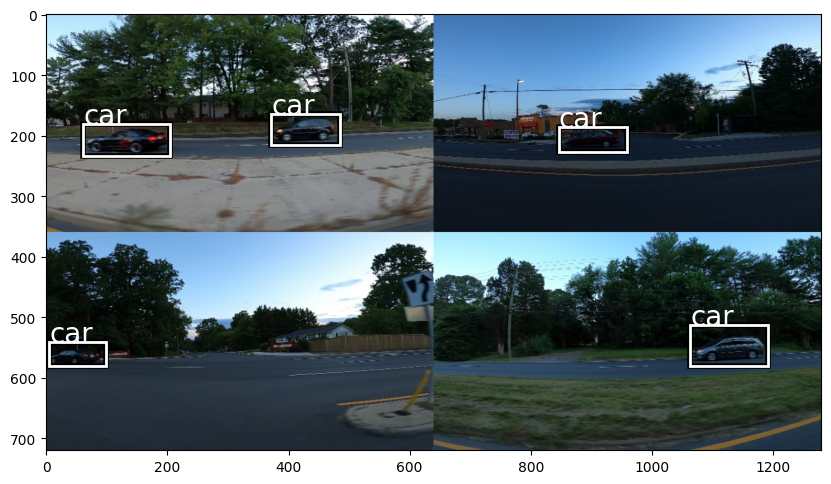

Image id: 848
Original Image size: (720, 1280)
Image size: (720, 1280, 3)


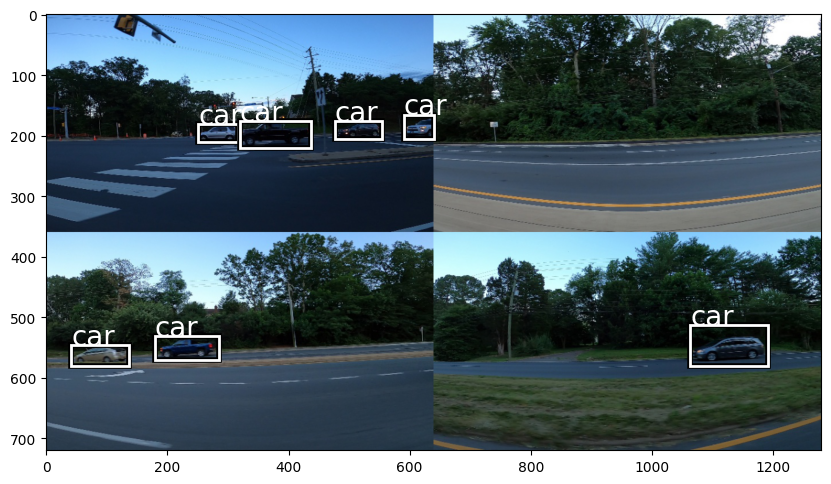

Image id: 848
Original Image size: (720, 1280)
Image size: (720, 1280, 3)


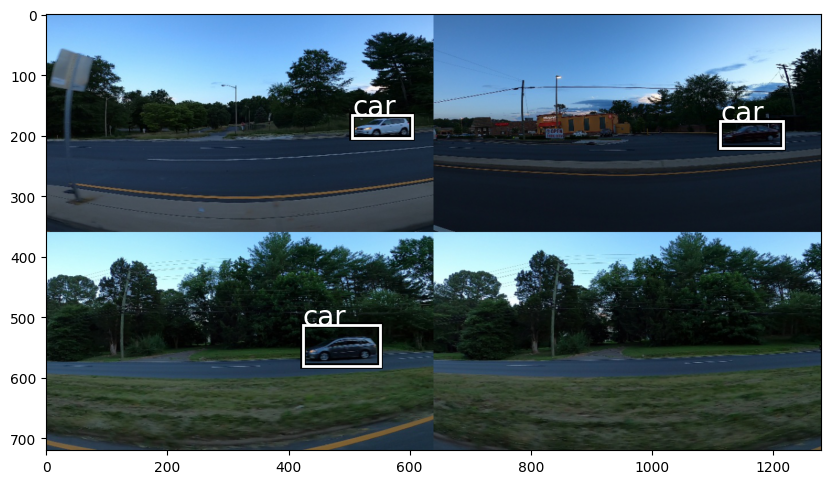

Image id: 848
Original Image size: (720, 1280)
Image size: (720, 1280, 3)


In [277]:
for i in range(3):
    plot_mosaic(4)

In [278]:
mds.enable(apply_mosaic_probability=0, apply_mixup_probability=1)

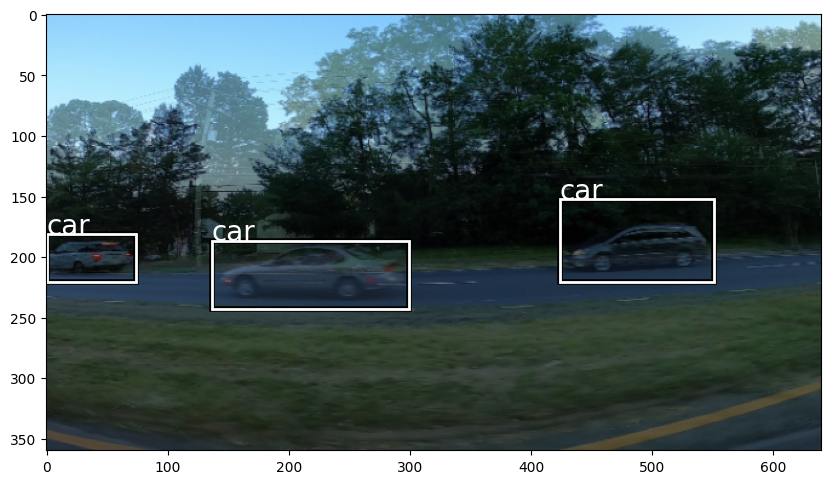

Image id: 848
Original Image size: (380, 676)
Image size: (360, 640, 3)


In [279]:
plot_mosaic(4)

In [280]:
mds.enable(apply_mosaic_probability=1, apply_mixup_probability=1)

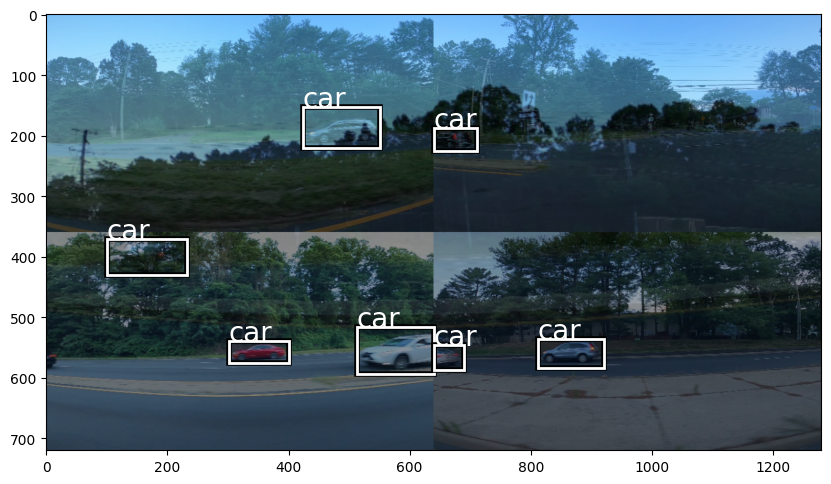

Image id: 848
Original Image size: (720, 1280)
Image size: (720, 1280, 3)


In [281]:
plot_mosaic(4)

### Add transforms 

In [282]:
def create_post_mosaic_transform(
        output_height,
        output_width,
        pad_colour=(0, 0, 0),
        rotation_range=(-10, 10),
        shear_range=(-10, 10),
        translation_percent_range=(-0.2, 0.2),
        scale_range=(0.08, 1.0),
        apply_prob=0.8,
):
    return A.Compose(
        [
            A.Affine(
                cval=pad_colour,
                rotate=rotation_range,
                shear=shear_range,
                translate_percent=translation_percent_range,
                scale=None,
                keep_ratio=True,
                p=apply_prob,
            ),
            A.HorizontalFlip(),
            A.RandomResizedCrop(height=output_height, width=output_width, scale=scale_range),
        ],
        bbox_params=A.BboxParams(format="pascal_voc", label_fields=["labels"], min_visibility=0.25),
    )

In [283]:
mds = MosaicMixupDataset(ds, apply_mixup_probability=0.2, post_mosaic_transforms=create_post_mosaic_transform(640, 640))

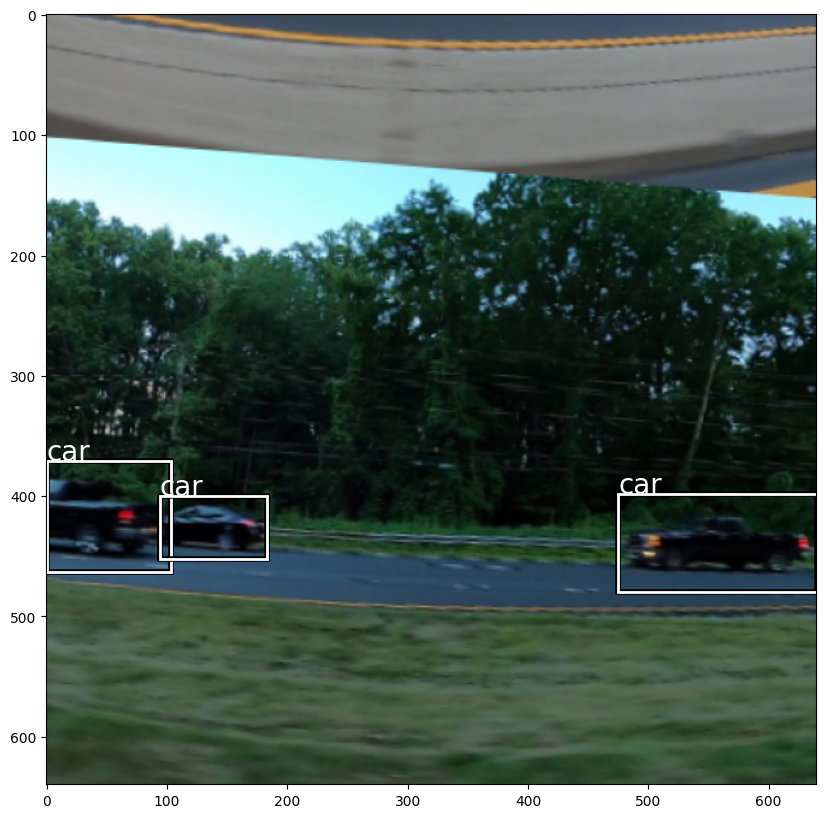

Image id: 848
Original Image size: (720, 1280)
Image size: (640, 640, 3)


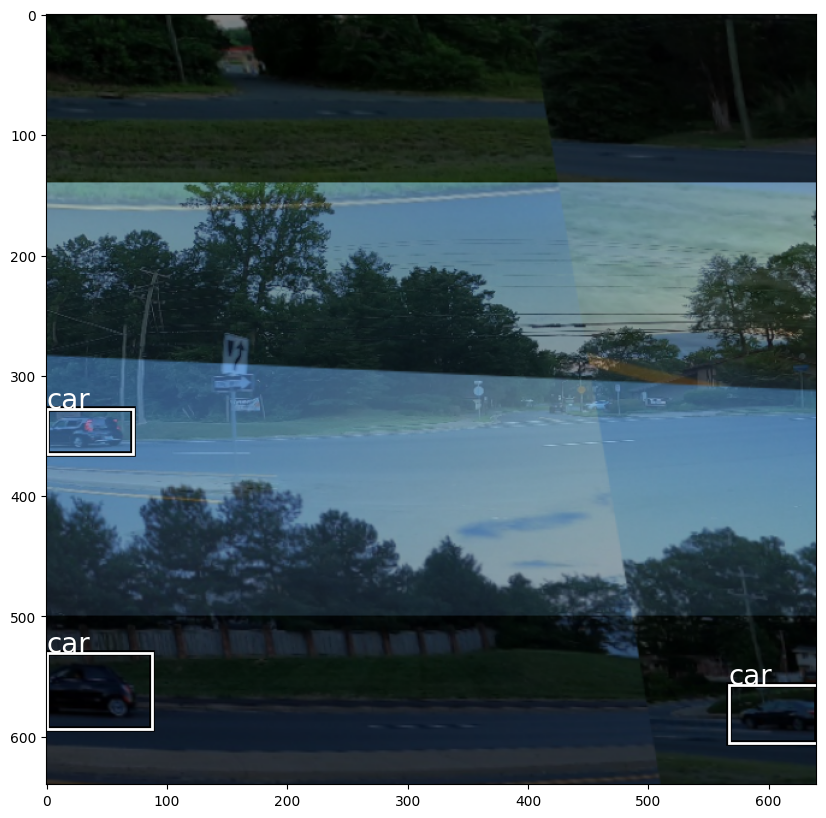

Image id: 848
Original Image size: (720, 1280)
Image size: (640, 640, 3)


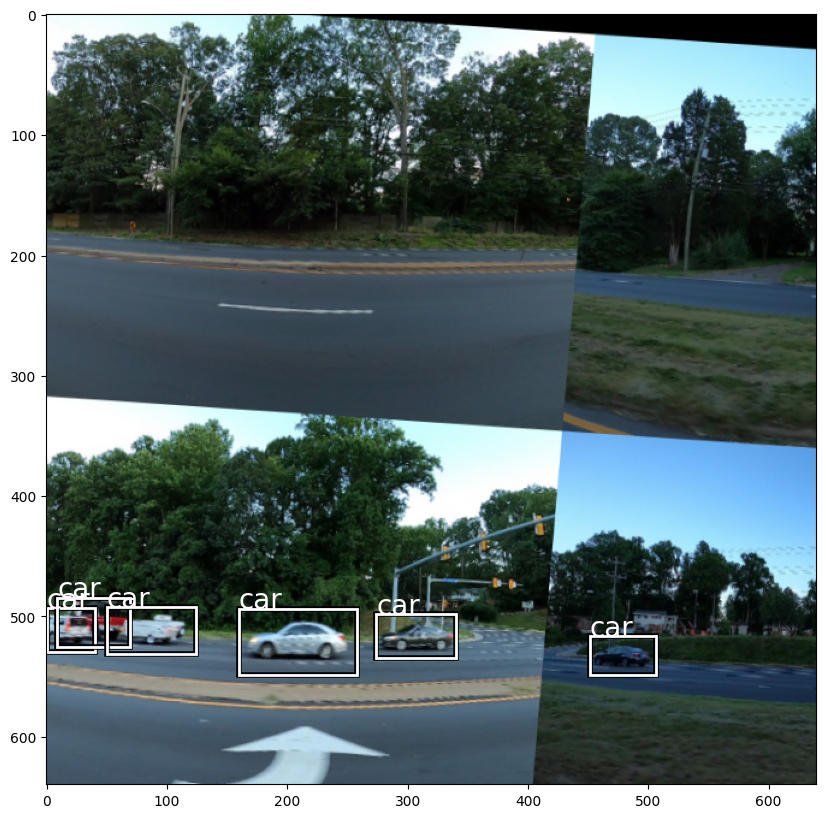

Image id: 848
Original Image size: (720, 1280)
Image size: (640, 640, 3)


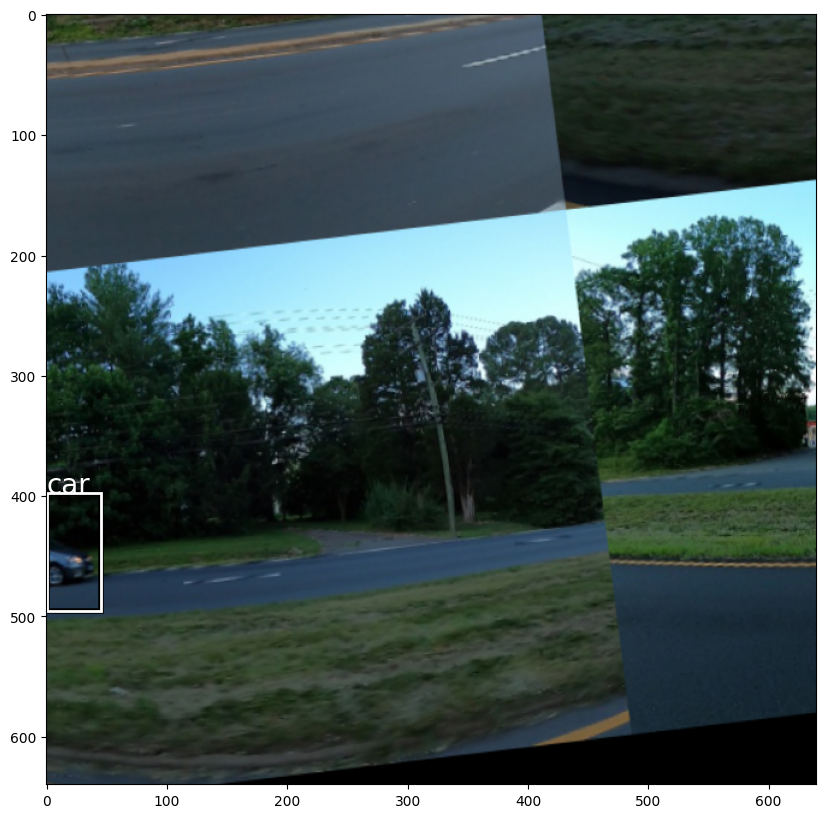

Image id: 848
Original Image size: (720, 1280)
Image size: (640, 640, 3)


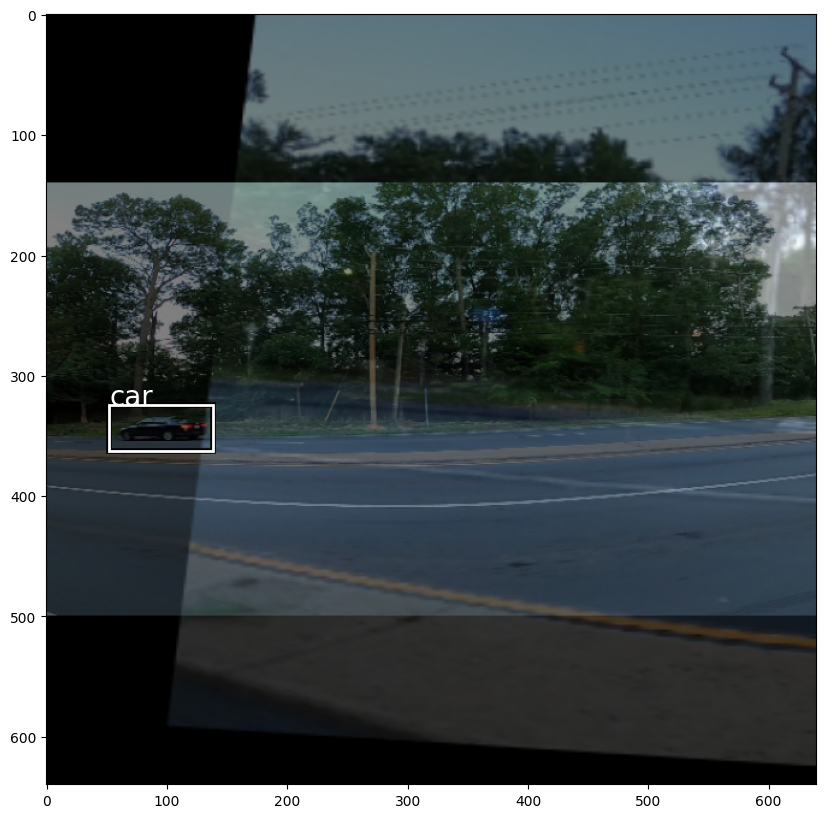

Image id: 848
Original Image size: (720, 1280)
Image size: (640, 640, 3)


In [285]:
for i in range(5):
    plot_mosaic(4)

### EMA? 

## Run training